In [1]:
from FlagComplex import FlagComplex
from Examples import construct_from_ratio
from ProjGeometryUtility import connecting_line, transform_four_points
import numpy as np
import drawSvg as draw
from DrawingUtility import drawcirc
from FlagTesselator import FlagTesselator

# Eruption flow on the tesselation of a four-tuple of flags
Most of what we do here is analogous to the `tutorial-flag-4tuple-eruption-flow.ipynb`. However, in this tutorial, we will also tesselate the complex, and look at the transformation of the tesselation.
## Setup

In [2]:
fcomplex = FlagComplex()

other_points = [np.array([1, 1, 1]), np.array([1, -1, 1]), np.array([-1, -1, 1]), np.array([-1, 1, 1])]
p0 = np.array([0, 1, 1])
q0 = other_points[0]

p1 = np.array([1, 0, 1])
q1 = other_points[1]

p2 = np.array([0, -1, 1])
q2 = other_points[2]

p3 = np.array([-1, 0, 1])
q3 = other_points[3]



fcomplex.add_flag(p0,q0)
fcomplex.add_flag(p1,q1)
fcomplex.add_flag(p2,q2)
fcomplex.add_flag(p3,q3)

fcomplex.set_projection_plane(np.array([0,0,1]))

import copy
fcomplex1 = copy.deepcopy(fcomplex)
ftesselator1 = FlagTesselator(fcomplex1, steps = 5)

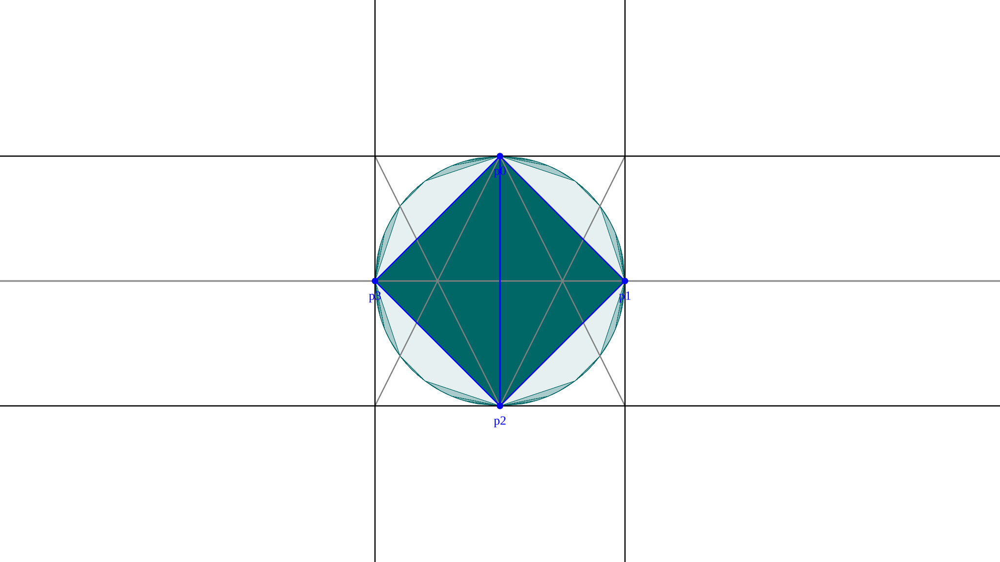

In [3]:
import copy

d = fcomplex.initialize_canvas()

fcomplex.create_triangulation()
fcomplex.draw_complex()

ftesselator = FlagTesselator(fcomplex, steps = 5)
d1 = copy.deepcopy(d)
ftesselator.print_image(old = d1, with_tiles = True)
fcomplex.visualize(d1,with_helper_lines=True, with_inner_triangles = False, with_label= False)
d1.savePng("ef_4_tesselation.png")
d1

## Parameters (t, t)

In [4]:
import copy

steps=180
step_width = 0.04

triangle0 = [1, 2, 0]
triangle1 = [2, 3, 0]

fcomplex.set_subdivision([2, 3, 0], {2: [0], 3: [2, 1], 0: [3]})
fcomplex.set_subdivision([1, 2, 0], {1: [0, 3], 2: [1], 0: [2]})

style = "Q"

for r in range(1, steps):
    fcomplex.erupt_complex_along_triangle(t=  step_width, triangle=triangle1, transformation_style=style)
    fcomplex.erupt_complex_along_triangle(t=  step_width, triangle=triangle0, transformation_style=style)
    fcomplex.projective_transformation = transform_four_points(fcomplex.qs, [other_points[i-1] for i in range(4)])
    
    d1 = copy.deepcopy(d)
    
    ftesselator.print_image(old = d1, with_tiles = True, fill_convex = False)
    fcomplex.visualize(d1,with_helper_lines=False, with_inner_triangles = False, with_label=False)

    d1.savePng("./temp/ef4tessplus_" + str(r) + ".png")

In [5]:
import numpy as np
from moviepy.editor import ImageSequenceClip

images_list = ["temp/ef4tessplus_"+str(r)+".png" for r in range(1,steps)]
animation = ImageSequenceClip(images_list, fps=25)
animation.write_videofile("eruption_flow_4tuple_tess_plusplus.mp4")
#animation.write_gif("eruption_flow_style_p.gif")
animation.ipython_display(fps=25, loop=True, autoplay=True)

t:   1%|          | 2/180 [00:00<00:15, 11.28it/s, now=None]

Moviepy - Building video eruption_flow_4tuple_tess_plusplus.mp4.
Moviepy - Writing video eruption_flow_4tuple_tess_plusplus.mp4



t:   0%|          | 0/180 [00:00<?, ?it/s, now=None]          

Moviepy - Done !
Moviepy - video ready eruption_flow_4tuple_tess_plusplus.mp4
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


## Parameters (-t, t)
### Normal visualization

In [6]:
import copy

fcomplex = copy.deepcopy(fcomplex1)
ftesselator = FlagTesselator(fcomplex, steps=4)

steps=180
step_width = 0.04

triangle0 = [1, 2, 0]
triangle1 = [2, 3, 0]

fcomplex.set_subdivision([2, 3, 0], {2: [0], 3: [2, 1], 0: [3]})
fcomplex.set_subdivision([1, 2, 0], {1: [0, 3], 2: [1], 0: [2]})

style = "Q"

for r in range(1, steps):
    fcomplex.erupt_complex_along_triangle(t=  step_width, triangle=triangle1, transformation_style=style)
    fcomplex.erupt_complex_along_triangle(t= -step_width, triangle=triangle0, transformation_style=style)
    fcomplex.projective_transformation = transform_four_points(fcomplex.qs, [other_points[i-1] for i in range(4)])
    
    d1 = copy.deepcopy(d)
    
    ftesselator.print_image(old = d1, with_tiles = True, fill_convex = False)
    fcomplex.visualize(d1,with_helper_lines=False, with_inner_triangles = False, with_label=False)

    d1.savePng("./temp/ef4tessminus_" + str(r) + ".png")

In [7]:
import numpy as np
from moviepy.editor import ImageSequenceClip

images_list = ["temp/ef4tessminus_"+str(r)+".png" for r in range(1,steps)]
animation = ImageSequenceClip(images_list, fps=25)
animation.write_videofile("eruption_flow_4tuple_tess_minusplus.mp4")
#animation.write_gif("eruption_flow_style_p.gif")
animation.ipython_display(fps=25, loop=True, autoplay=True)

t:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

Moviepy - Building video eruption_flow_4tuple_tess_minusplus.mp4.
Moviepy - Writing video eruption_flow_4tuple_tess_minusplus.mp4



t:   0%|          | 0/180 [00:00<?, ?it/s, now=None]          

Moviepy - Done !
Moviepy - video ready eruption_flow_4tuple_tess_minusplus.mp4
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


### Visualization without tiles

In [8]:
import copy

fcomplex = copy.deepcopy(fcomplex1)
ftesselator = FlagTesselator(fcomplex, steps=4)

steps=180
step_width = 0.04

triangle0 = [1, 2, 0]
triangle1 = [2, 3, 0]

fcomplex.set_subdivision([2, 3, 0], {2: [0], 3: [2, 1], 0: [3]})
fcomplex.set_subdivision([1, 2, 0], {1: [0, 3], 2: [1], 0: [2]})

style = "Q"

for r in range(1, steps):
    print(r)
    fcomplex.erupt_complex_along_triangle(t=  step_width, triangle=triangle1, transformation_style=style)
    fcomplex.erupt_complex_along_triangle(t= -step_width, triangle=triangle0, transformation_style=style)
    fcomplex.projective_transformation = transform_four_points(fcomplex.qs, [other_points[i-1] for i in range(4)])
    
    d1 = copy.deepcopy(d)
    
    ftesselator.print_image(old = d1, with_tiles = False, fill_convex = True, with_initial = False)
    fcomplex.visualize(d1,with_helper_lines=False, with_inner_triangles = False, with_label=False)

    d1.savePng("./temp/ef4tessminus_notiles_" + str(r) + ".png")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179


In [9]:
import numpy as np
from moviepy.editor import ImageSequenceClip

images_list = ["temp/ef4tessminus_notiles_"+str(r)+".png" for r in range(1,steps)]
animation = ImageSequenceClip(images_list, fps=25)
animation.write_videofile("eruption_flow_4tuple_tess_minusplus_notiles.mp4")
#animation.write_gif("eruption_flow_style_p.gif")
animation.ipython_display(fps=25, loop=True, autoplay=True)

t:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

Moviepy - Building video eruption_flow_4tuple_tess_minusplus_notiles.mp4.
Moviepy - Writing video eruption_flow_4tuple_tess_minusplus_notiles.mp4



t:   0%|          | 0/180 [00:00<?, ?it/s, now=None]          

Moviepy - Done !
Moviepy - video ready eruption_flow_4tuple_tess_minusplus_notiles.mp4
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


### Visualization without transformation to initial situation

In [10]:
import copy

fcomplex = copy.deepcopy(fcomplex1)
ftesselator = FlagTesselator(fcomplex, steps=4)

steps=130
step_width = 0.04

triangle0 = [1, 2, 0]
triangle1 = [2, 3, 0]

fcomplex.set_subdivision([2, 3, 0], {2: [0], 3: [2, 1], 0: [3]})
fcomplex.set_subdivision([1, 2, 0], {1: [0, 3], 2: [1], 0: [2]})

style = "Q"

for r in range(1, steps):
    print(r)
    fcomplex.erupt_complex_along_triangle(t=  step_width, triangle=triangle1, transformation_style=style)
    fcomplex.erupt_complex_along_triangle(t= -step_width, triangle=triangle0, transformation_style=style)
    
    d1 = copy.deepcopy(d)
    
    ftesselator.print_image(old = d1, with_tiles = False, fill_convex = True, with_initial = True)
    fcomplex.visualize(d1,with_helper_lines=False, with_inner_triangles = False, with_label=False)

    d1.savePng("./temp/ef4tessminus_notransform_" + str(r) + ".png")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129


In [11]:
import numpy as np
from moviepy.editor import ImageSequenceClip

images_list = ["temp/ef4tessminus_notransform_"+str(r)+".png" for r in range(1,steps)]
animation = ImageSequenceClip(images_list, fps=25)
animation.write_videofile("eruption_flow_4tuple_tess_minusplus_notransform.mp4")
#animation.write_gif("eruption_flow_style_p.gif")
animation.ipython_display(fps=25, loop=True, autoplay=True)

t:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

Moviepy - Building video eruption_flow_4tuple_tess_minusplus_notransform.mp4.
Moviepy - Writing video eruption_flow_4tuple_tess_minusplus_notransform.mp4



t:   0%|          | 0/130 [00:00<?, ?it/s, now=None]          

Moviepy - Done !
Moviepy - video ready eruption_flow_4tuple_tess_minusplus_notransform.mp4
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
